# Projet Machine Learning - Bank Account Fraud

## 1. Préparation et visualisation des données

### 1.1 Préparation du workspace

####   • Import des librairies
Dans un premier temps, on importe les librairies qui nous seront utiles tout au long du projet.

In [1]:
# Données
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency

#Graphiques
import seaborn as sns
sns.set()
import plotly.express as px
import matplotlib.pyplot as plt

#Machine Learning
import sklearn.preprocessing as preproc

#### • Import des données
On importe ensuite nos données.

In [11]:
# Import des données
data_set = pd.read_csv("Base.csv",sep=",",decimal=".",index_col=0)

### 1.2 Observations des données et des variables

Notre étude commence par l'observation des données. Tout d'abord, nous montrons les premières lignes du tableau afin d'identifier les premières tendances et particularités.

In [12]:
# Premières lignes
data_set.head()

,income,name_email_similarity,prev_address_months_count,current_address_months_count,customer_age,days_since_request,intended_balcon_amount,payment_type,zip_count_4w,velocity_6h,...,has_other_cards,proposed_credit_limit,foreign_request,source,session_length_in_minutes,device_os,keep_alive_session,device_distinct_emails_8w,device_fraud_count,month
fraud_bool,,,,,,,,,,,,,,,,,,,,,
0,0.3,0.986506,-1,25,40,0.006735,102.453711,AA,1059,13096.035018,...,0,1500.0,0,INTERNET,16.224843,linux,1,1,0,0
0,0.8,0.617426,-1,89,20,0.010095,-0.849551,AD,1658,9223.283431,...,0,1500.0,0,INTERNET,3.363854,other,1,1,0,0
0,0.8,0.996707,9,14,40,0.012316,-1.490386,AB,1095,4471.472149,...,0,200.0,0,INTERNET,22.730559,windows,0,1,0,0
0,0.6,0.475100,11,14,30,0.006991,-1.863101,AB,3483,14431.993621,...,0,200.0,0,INTERNET,15.215816,linux,1,1,0,0
0,0.9,0.842307,-1,29,40,5.742626,47.152498,AA,2339,7601.511579,...,0,200.0,0,INTERNET,3.743048,other,0,1,0,0


In [13]:
# Dimensions
data_set.shape

(1000000, 31)

In [14]:
#Transformer la colonne fraud_bool （index） en une colonne.
data_set = data_set.reset_index()
data_set.head()

,fraud_bool,income,name_email_similarity,prev_address_months_count,current_address_months_count,customer_age,days_since_request,intended_balcon_amount,payment_type,zip_count_4w,...,has_other_cards,proposed_credit_limit,foreign_request,source,session_length_in_minutes,device_os,keep_alive_session,device_distinct_emails_8w,device_fraud_count,month
0,0,0.3,0.986506,-1,25,40,0.006735,102.453711,AA,1059,...,0,1500.0,0,INTERNET,16.224843,linux,1,1,0,0
1,0,0.8,0.617426,-1,89,20,0.010095,-0.849551,AD,1658,...,0,1500.0,0,INTERNET,3.363854,other,1,1,0,0
2,0,0.8,0.996707,9,14,40,0.012316,-1.490386,AB,1095,...,0,200.0,0,INTERNET,22.730559,windows,0,1,0,0
3,0,0.6,0.475100,11,14,30,0.006991,-1.863101,AB,3483,...,0,200.0,0,INTERNET,15.215816,linux,1,1,0,0
4,0,0.9,0.842307,-1,29,40,5.742626,47.152498,AA,2339,...,0,200.0,0,INTERNET,3.743048,other,0,1,0,0


Nous disposons de 1000000 données qui représentent des comptes bancaires, et nous disposons de 31 covariables plus de la variable target qui est la colonne fraud_bool, à savoir si c'est fraud ou pas.

In [15]:
# Liste des colonnes
data_set.columns

Index(['fraud_bool', 'income', 'name_email_similarity',
       'prev_address_months_count', 'current_address_months_count',
       'customer_age', 'days_since_request', 'intended_balcon_amount',
       'payment_type', 'zip_count_4w', 'velocity_6h', 'velocity_24h',
       'velocity_4w', 'bank_branch_count_8w',
       'date_of_birth_distinct_emails_4w', 'employment_status',
       'credit_risk_score', 'email_is_free', 'housing_status',
       'phone_home_valid', 'phone_mobile_valid', 'bank_months_count',
       'has_other_cards', 'proposed_credit_limit', 'foreign_request', 'source',
       'session_length_in_minutes', 'device_os', 'keep_alive_session',
       'device_distinct_emails_8w', 'device_fraud_count', 'month'],
      dtype='object')

In [16]:
# Liste des colonnes selon leur type
data_set.dtypes

fraud_bool                            int64
income                              float64
name_email_similarity               float64
prev_address_months_count             int64
current_address_months_count          int64
customer_age                          int64
days_since_request                  float64
intended_balcon_amount              float64
payment_type                         object
zip_count_4w                          int64
velocity_6h                         float64
velocity_24h                        float64
velocity_4w                         float64
bank_branch_count_8w                  int64
date_of_birth_distinct_emails_4w      int64
employment_status                    object
credit_risk_score                     int64
email_is_free                         int64
housing_status                       object
phone_home_valid                      int64
phone_mobile_valid                    int64
bank_months_count                     int64
has_other_cards                 

On observe que la base de données comprend plusieurs variables, dont certaines sont de type numérique (int64， float64) et d'autres variables sont de type object.

Certaines variables sont catégoriques. Par exemple la variable "payment_type" a cinque catégories distinctes (AA, AB, AC, AD, et AE) et 'source' (INTERNET et TELEAPP).

Un résumé des variables est ensuite affiché. Des statistiques descriptives résument les principales caractéristiques de chaque variable, fournissant des indices sur la distribution des données.

In [17]:
# Synthèse des variables
data_set.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
fraud_bool,1000000.0,0.011029,0.104438,0.000000e+00,0.000000,0.000000,0.000000,1.000000
income,1000000.0,0.562696,0.290343,1.000000e-01,0.300000,0.600000,0.800000,0.900000
name_email_similarity,1000000.0,0.493694,0.289125,1.434550e-06,0.225216,0.492153,0.755567,0.999999
prev_address_months_count,1000000.0,16.718568,44.046230,-1.000000e+00,-1.000000,-1.000000,12.000000,383.000000
current_address_months_count,1000000.0,86.587867,88.406599,-1.000000e+00,19.000000,52.000000,130.000000,428.000000
customer_age,1000000.0,33.689080,12.025799,1.000000e+01,20.000000,30.000000,40.000000,90.000000
days_since_request,1000000.0,1.025705,5.381835,4.036860e-09,0.007193,0.015176,0.026331,78.456904
intended_balcon_amount,1000000.0,8.661499,20.236155,-1.553055e+01,-1.181488,-0.830507,4.984176,112.956928
zip_count_4w,1000000.0,1572.692049,1005.374565,1.000000e+00,894.000000,1263.000000,1944.000000,6700.000000
velocity_6h,1000000.0,5665.296605,3009.380665,-1.706031e+02,3436.365848,5319.769349,7680.717827,16715.565404


In [18]:
# Déterminer si les valeurs de chaque colonne ne sont pas identiques
unique_counts = data_set.nunique()
single_unique_columns = unique_counts[unique_counts == 1].index.tolist()
single_unique_columns

['device_fraud_count']

In [19]:
# supprimer la colonne 'device_fraud_count'
data_set=data_set.drop(columns = ['device_fraud_count'])
data_set.shape

(1000000, 31)

### 1.3 Analyse de la distribution de la variable cible

In [11]:
# Observation de la distribution de la variable cible
fig = px.histogram(data_set, x = "fraud_bool", nbins=2)
fig.update_traces(texttemplate='%{y}', textposition='outside')
fig.update_layout(xaxis=dict(tickmode='array',tickvals=[0, 1],ticktext=['0', '1']))
fig.show()

On remarque que les données de la variable cible ne sont pas équilibrées.Le nombre de fraudes représente environ 1,1 % du nombre total.
Cela peut nous poser problème Oversampling lors de la mise en place de nos modèles. Nous nous attaquerons à ce problème après.

## 2. Retraitement des données & Pré-processing 

### 2.1 Data Cleaning

#### • Valeurs doublons
La base de données est générée par le GAN avec un filtre de duplicate, ce qui signifie qu'il n'y a pas de doublon dans l'ensemble de données.

In [12]:
duplicates = data_set[data_set.duplicated(keep=False)] 
print("Duplicate  are:\n", duplicates)

Duplicate  are:
 Empty DataFrame
Columns: [fraud_bool, income, name_email_similarity, prev_address_months_count, current_address_months_count, customer_age, days_since_request, intended_balcon_amount, payment_type, zip_count_4w, velocity_6h, velocity_24h, velocity_4w, bank_branch_count_8w, date_of_birth_distinct_emails_4w, employment_status, credit_risk_score, email_is_free, housing_status, phone_home_valid, phone_mobile_valid, bank_months_count, has_other_cards, proposed_credit_limit, foreign_request, source, session_length_in_minutes, device_os, keep_alive_session, device_distinct_emails_8w, month]
Index: []

[0 rows x 31 columns]


#### • Retraitement des valeurs manquantes
On affiche la nombre de valeurs manquantes par variable, ce qui permet de quantifier la qualité des données. Selon le fournisseur de la base de données, pour les colonnes "prev_address_months_count","current_address_months_count","session_length_in_minutes","bank_months_count", et "device_distinct_emails", une valeur de -1 signifie que les données sont manquantes. Pour "intended_balcon_amount", une valeur négative est une donnée manquante.

In [20]:
missing_values_1 = [
    ('prev_address_months_count', -1),
    ('current_address_months_count', -1),
    ('bank_months_count', -1),
    ('device_distinct_emails_8w', -1)
]
# Remplacement des valeurs manquantes spécifiées (par NaN)
for col, missing_value in missing_values_1:
    data_set[col]=data_set[col].replace(missing_value, np.nan)

data_set['session_length_in_minutes'] = pd.to_numeric(data_set['session_length_in_minutes'])
data_set['session_length_in_minutes'] = data_set['session_length_in_minutes'].apply(lambda x:np.nan if x==-1 else x)

data_set['intended_balcon_amount'] = pd.to_numeric(data_set['intended_balcon_amount'])
data_set['intended_balcon_amount'] = data_set['intended_balcon_amount'].apply(lambda x:np.nan if x<0 else x)


In [21]:
# Nombre de NA par variable
nan_count = pd.DataFrame(data_set.isna().sum(), columns=["Nombre_NA"])

# Ajout du % par rapport à la taille de la base de données
nan_count["Pourcentage"]= nan_count.divide(data_set.shape[0])*100

print(nan_count)

                                  Nombre_NA  Pourcentage
fraud_bool                                0       0.0000
income                                    0       0.0000
name_email_similarity                     0       0.0000
prev_address_months_count            712920      71.2920
current_address_months_count           4254       0.4254
customer_age                              0       0.0000
days_since_request                        0       0.0000
intended_balcon_amount               742523      74.2523
payment_type                              0       0.0000
zip_count_4w                              0       0.0000
velocity_6h                               0       0.0000
velocity_24h                              0       0.0000
velocity_4w                               0       0.0000
bank_branch_count_8w                      0       0.0000
date_of_birth_distinct_emails_4w          0       0.0000
employment_status                         0       0.0000
credit_risk_score              

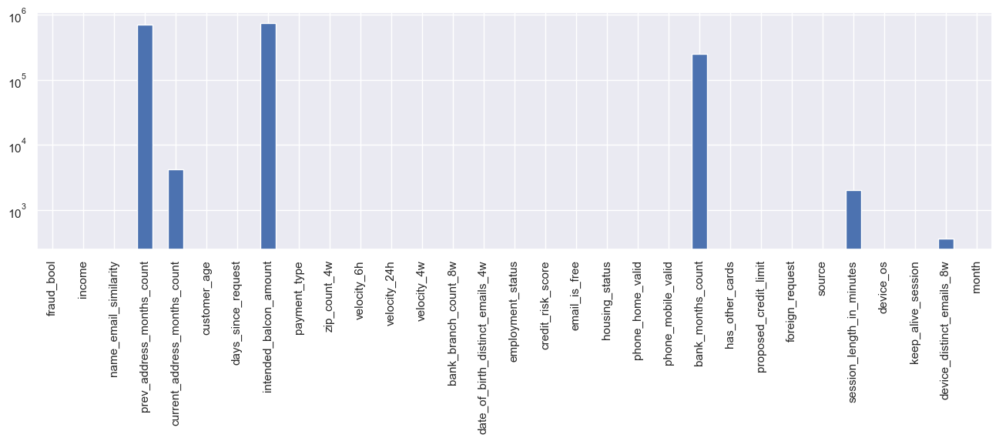

In [22]:
plt.figure(figsize=(16,4))
ax = (len(data_set.index) - data_set.count()).plot.bar()
ax.set_yscale('log') 

- On supprime les caractéristiques pour lesquelles les valeurs manquantes exitstent.

In [23]:
data_set = data_set.drop(data_set.columns[data_set.isnull().any()], axis=1)
print(data_set.shape)

(1000000, 25)


### 2.2 Dimension Reduction

In [24]:
data_trans = data_set.drop("fraud_bool", axis=1)

In [57]:
# Séparation en variables qualitatives ou catégorielles
variables_numeriques = []
variables_categorielles = []
variables_numeriques_name = []
variables_categorielles_name = []
for col in data_trans.columns:
        if str(data_trans[col].dtypes) in ["int64","float64"]:
            if len(data_trans[col].unique())==2 :
                variables_categorielles.append(data_trans[col])
                variables_categorielles_name.append(col)
            else :
                variables_numeriques.append(data_trans[col])
                variables_numeriques_name.append(col)
        else :
            if len(data_trans[col].unique())==2 :
                variables_categorielles.append(data_trans[col])
                variables_categorielles_name.append(col)
            else :
                variables_categorielles.append(data_trans[col])
                variables_categorielles_name.append(col)

#### Relation entre les variables explicatives et la variable cible

- Variables numériques

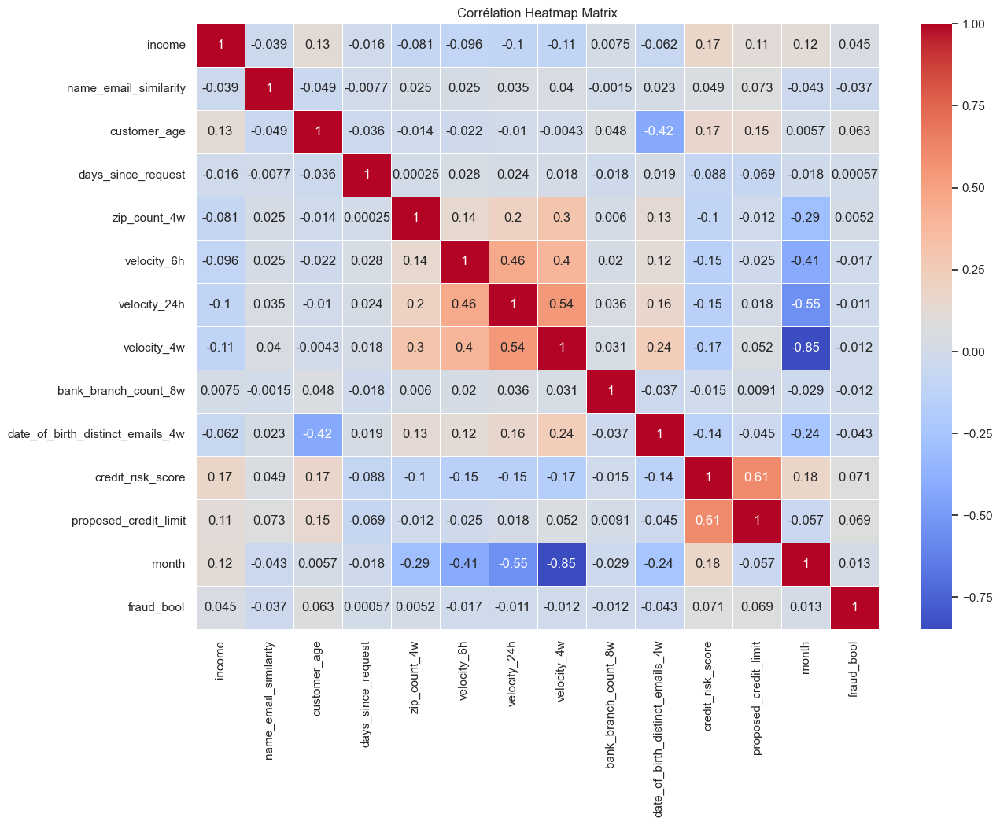

In [57]:
variables_numeriques_name.append('fraud_bool') #ajouter Y
df_variables_numeriques = data_set[variables_numeriques_name]
correlation_matrix = df_variables_numeriques.corr()
plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Corrélation Heatmap Matrix')
plt.show()

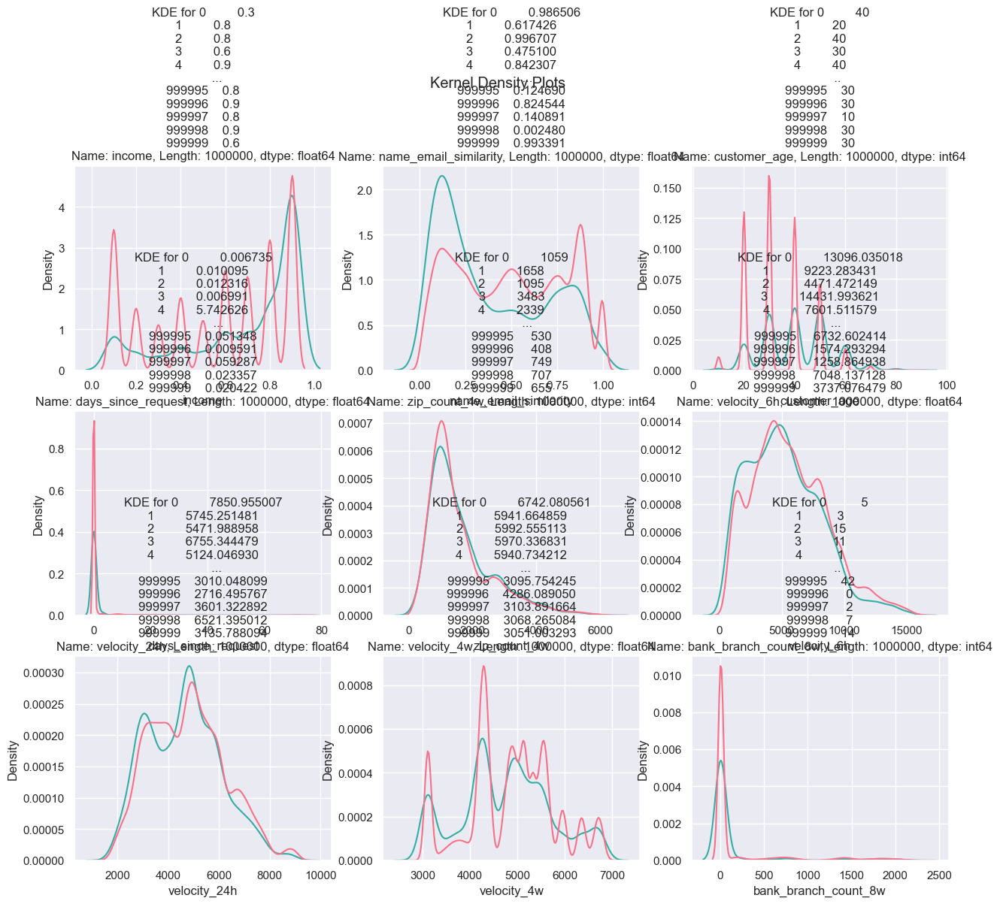

In [20]:
fig, axes = plt.subplots(3, 3, figsize=(15, 12))
fig.suptitle('Kernel Density Plots')

for var, ax in zip(variables_numeriques[:10], axes.flatten()):
    sns.kdeplot(data=data_set, x=var, hue='fraud_bool', palette='husl', common_norm=False, ax=ax)
    ax.set_title(f'KDE for {var}')
    handles, labels = ax.get_legend_handles_labels()

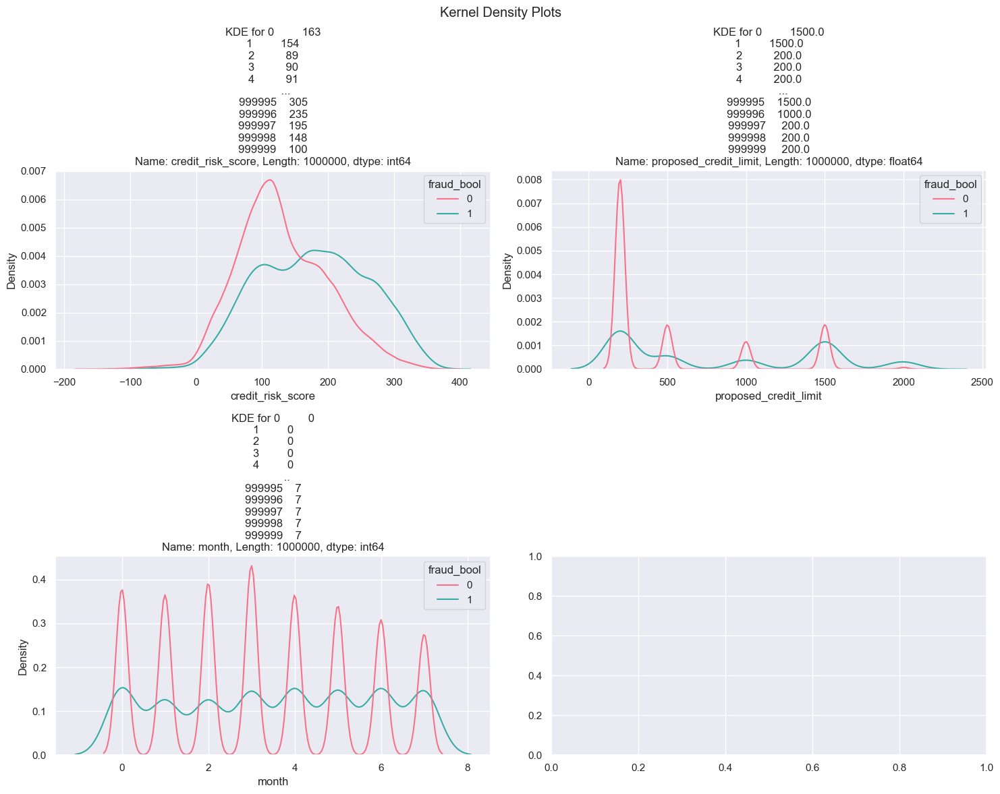

In [40]:
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('Kernel Density Plots')

for var, ax in zip(variables_numeriques[10:], axes.flatten()):
    sns.kdeplot(data=data_set, x=var, hue='fraud_bool', palette='husl', common_norm=False, ax=ax)
    ax.set_title(f'KDE for {var}')
    handles, labels = ax.get_legend_handles_labels()
plt.tight_layout()

Le graphique Heatmap Matrix montre que "days_since_request" et "zip_count_4w" sont moins corrélés avec la variable dépendante "Y".
Dans les graphiques de densité des variables, il apparaît que certaines variables montrent des distinctions claires entre les deux catégories, ce qui suggère qu'elles possèdent un potentiel prédictif élevé pour la classification. Les variables telles que credit_risk_score, proposed_credit_limit, days_since_request, et income montrent des différences significatives entre les distributions des deux catégories. En revanche, les variables comme velocity_6h, zip_count_4w, bank_branch_count, date_of_birth_distinct_emails_4w, présentent des distributions très similaires, indiquant ainsi une faible puissance discriminatoire. Ces dernières pourraient être exclues.

- Variables Categorielles


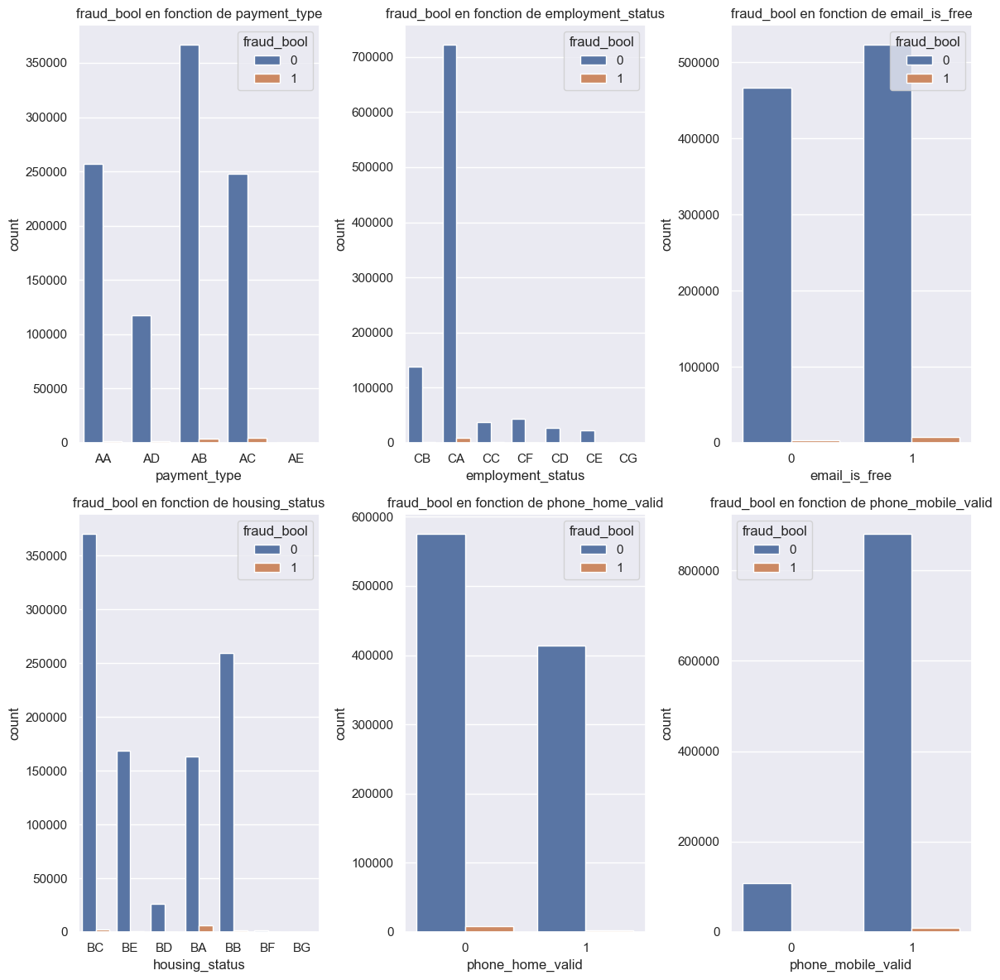

In [31]:
# Représentation de la variable dépendante avec les variables explicatves catégorielles
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 12))

for var, ax in zip(variables_categorielles_name[:7], axes.flatten()):
    sns.countplot(data=data_set, x=var, hue='fraud_bool', ax=ax)
    ax.set_title(f'fraud_bool en fonction de {var}')
    
plt.tight_layout()
plt.show()


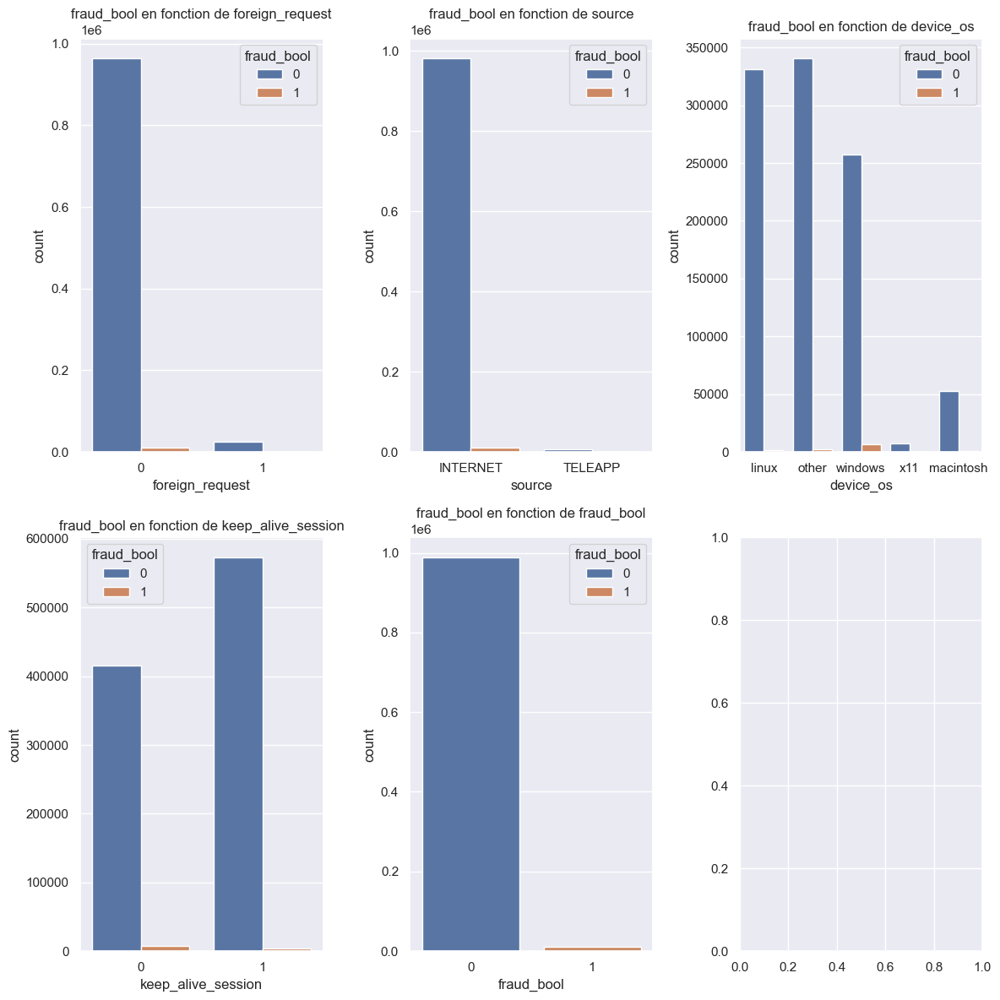

In [32]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 12))
for var, ax in zip(variables_categorielles_name[7:], axes.flatten()):
    sns.countplot(data=data_set, x=var, hue='fraud_bool', ax=ax)
    ax.set_title(f'fraud_bool en fonction de {var}')
    
plt.tight_layout()
plt.show()

 Comme on peut le voir, en raison du déséquilibre de la base de données, pour toutes les variables catégorielles, le nombre de "fraud_bool = 1" (indiquant qu'il y a eu fraude) est très faible. Donc pour mieux comprendre la corélation entre les varaibles, on crée une fonction pour faire le test Cramer's V.




 Test Cramer's V des variables catégorielles

In [42]:
# On extrait les variables catégorielles
vars_categorielles['fraud_bool']= data_set['fraud_bool']  #ajouter la variable Y
vars_categorielles = pd.DataFrame(variables_categorielles).transpose()

In [27]:
# fonction pour calculer le coefficient de corrélation de Cramer's V entre deux variables catégorielles. 
def cramers_v(var1, var2):
    # Construction du tableau de contingence
    contingency_table = pd.crosstab(var1, var2) 
    # Calcul des statistiques
    chi2, p, dof, expected = chi2_contingency(contingency_table, correction=False)
    # Nombre total d'observations
    observations = np.sum(contingency_table.values)
    # Calcul du coefficient de Cramer V
    cramer_v = np.sqrt(chi2 / (observations * min(dof, (contingency_table.shape[0]-1), (contingency_table.shape[1]-1))))
    return cramer_v

In [28]:
rows= []

for var1 in vars_categorielles:
  col = []
  for var2 in vars_categorielles :
    cramers = cramers_v(vars_categorielles[var1], vars_categorielles[var2]) # V de Cramer
    col.append(round(cramers, 2)) # arrondi du résultat
  rows.append(col)

cramers_results = np.array(rows)
v_cramer_resultats = pd.DataFrame(cramers_results, columns = vars_categorielles.columns,
                                  index = vars_categorielles.columns)

v_cramer_resultats

,payment_type,employment_status,email_is_free,housing_status,phone_home_valid,phone_mobile_valid,has_other_cards,foreign_request,source,device_os,keep_alive_session
payment_type,1.00,0.06,0.03,0.10,0.08,0.06,0.14,0.02,0.06,0.06,0.03
employment_status,0.06,1.00,0.02,0.11,0.14,0.14,0.04,0.02,0.04,0.06,0.06
email_is_free,0.03,0.02,1.00,0.09,0.01,0.03,0.03,0.03,0.00,0.15,0.02
housing_status,0.10,0.11,0.09,1.00,0.10,0.09,0.08,0.03,0.02,0.08,0.07
phone_home_valid,0.08,0.14,0.01,0.10,1.00,0.27,0.11,0.00,0.01,0.06,0.04
phone_mobile_valid,0.06,0.14,0.03,0.09,0.27,1.00,0.01,0.00,0.02,0.08,0.02
has_other_cards,0.14,0.04,0.03,0.08,0.11,0.01,1.00,0.00,0.02,0.04,0.10
foreign_request,0.02,0.02,0.03,0.03,0.00,0.00,0.00,1.00,0.01,0.06,0.02
source,0.06,0.04,0.00,0.02,0.01,0.02,0.02,0.01,1.00,0.08,0.08
device_os,0.06,0.06,0.15,0.08,0.06,0.08,0.04,0.06,0.08,1.00,0.07


In [30]:
#On repère les variables trop corrélées
for i in range(v_cramer_resultats.shape[0]):
  for j in range(i+1,v_cramer_resultats.shape[0]) :
    if v_cramer_resultats.iloc[i,j] > 0.7 :
        print(v_cramer_resultats.index.to_numpy()[i]+" et "+ v_cramer_resultats.columns[j]
              + " sont trop dépendantes, V-CRAMER = " + str(v_cramer_resultats.iloc[i,j]))

On observe qu'aucune des variables catégorielles de notre dataset n'est excessivement corrélée. Cependant, on a identifié des corrélations relativement élevées entre certaines paires de variables : phone_home_valid et phone_mobile_valid, has_other_cards et payment_type, phone_home_valid et employment_status, ainsi que device_os et email_is_free. Cela peut être expliqué par des comportements ou des caractéristiques communes.

In [50]:
cramers_v_Y = {}

for col in vars_categorielles.columns:
    cramers_v_value = cramers_v(data_set['fraud_bool'], vars_categorielles[col])
    cramers_v_Y[col] = cramers_v_value

cramers_v_df = pd.DataFrame(list(cramers_v_Y.items()), columns=['Variable', 'Cramers_V'])
cramers_v_df

,Variable,Cramers_V
0,payment_type,0.039094
1,employment_status,0.039655
2,email_is_free,0.027758
3,housing_status,0.114903
4,phone_home_valid,0.035128
5,phone_mobile_valid,0.013180
6,has_other_cards,0.035156
7,foreign_request,0.016885
8,source,0.003922
9,device_os,0.080492


Parmi les variables catégorielles, housing_status, device_os et keep_alive_session montrent une corrélation plus forte avec la variable dépendante (fraud_bool). De plus, ces variables ne montrent pas de corrélations significatives entre elles, ce qui les rend appropriées pour être sélectionnées dans l'entraînement de notre modèle.

Corrélation des variables numériques

In [51]:
# On extrait les variables numériques
vars_numeriques = pd.DataFrame(variables_numeriques).transpose()
# Corrélation de Pearson
correlations_num = vars_numeriques.corr(method='pearson')
correlations_num

,income,name_email_similarity,customer_age,days_since_request,zip_count_4w,velocity_6h,velocity_24h,velocity_4w,bank_branch_count_8w,date_of_birth_distinct_emails_4w,credit_risk_score,proposed_credit_limit,month
income,1.000000,-0.038519,0.125822,-0.015877,-0.080581,-0.096431,-0.101269,-0.106333,0.007474,-0.062348,0.171447,0.108868,0.116479
name_email_similarity,-0.038519,1.000000,-0.048902,-0.007736,0.025114,0.024881,0.035221,0.039968,-0.001470,0.022994,0.049126,0.073159,-0.042949
customer_age,0.125822,-0.048902,1.000000,-0.035999,-0.014176,-0.022063,-0.010030,-0.004303,0.048412,-0.420173,0.166094,0.148857,0.005694
days_since_request,-0.015877,-0.007736,-0.035999,1.000000,0.000249,0.027968,0.023869,0.017706,-0.018173,0.018731,-0.088141,-0.068670,-0.017938
zip_count_4w,-0.080581,0.025114,-0.014176,0.000249,1.000000,0.142372,0.201186,0.302955,0.005958,0.126885,-0.102645,-0.011651,-0.287203
velocity_6h,-0.096431,0.024881,-0.022063,0.027968,0.142372,1.000000,0.464003,0.400254,0.020140,0.118752,-0.145254,-0.025005,-0.409148
velocity_24h,-0.101269,0.035221,-0.010030,0.023869,0.201186,0.464003,1.000000,0.539115,0.036062,0.155434,-0.146770,0.017725,-0.549919
velocity_4w,-0.106333,0.039968,-0.004303,0.017706,0.302955,0.400254,0.539115,1.000000,0.031267,0.242365,-0.168766,0.052440,-0.848100
bank_branch_count_8w,0.007474,-0.001470,0.048412,-0.018173,0.005958,0.020140,0.036062,0.031267,1.000000,-0.036952,-0.014569,0.009072,-0.029182
date_of_birth_distinct_emails_4w,-0.062348,0.022994,-0.420173,0.018731,0.126885,0.118752,0.155434,0.242365,-0.036952,1.000000,-0.137338,-0.044810,-0.244779


In [56]:
# On repère les variables trop corrélées
nb_variables = correlations_num.shape[0]
for i in range(nb_variables):
  for j in range(i+1,nb_variables) :
    if abs(correlations_num.iloc[i,j]) > 0.7 :
        print(correlations_num.index.to_numpy()[i]+" et "+
              correlations_num.columns[j] + " sont trop dépendantes, corr = " + str(correlations_num.iloc[i,j]))

velocity_4w et month sont trop dépendantes, corr = -0.8481003026658848


La présence de variables trop corrélées peut également perturber les différents modèles et diminuer les performances. Nous essayerons donc de supprimer ces variables trop corrélées.

#### Conclusion: 
#### D'après l'analyse des variables catégorielles et numériques en considérant leur collélation avec le comportement frauduleux, on a sélectionné un total de dix variables qui semblent les plus pertinentes pour prédire la fraude. Ces choix incluent housing_status, device_os, keep_alive_session; income, customer_age, et name_email_similarity pour leurs significatives corrélation avec Y (fraud_loop) , ainsi que credit_risk_score et proposed_credit_limit pour leurs distributions distinctes observées dans les graphiques KDE. Les variables additionnelles comme employment_status, payment_type et zip_count_4w, ont été choisies pour leur potentiel influence sur le comportement de fraude, malgré des valeurs de Cramer's V moins élevées. 



## 3. Training et Validation

 - Normalisation des variables numériques

In [69]:
# Normalisation des variables numériques
preproc_scale = preproc.StandardScaler(with_mean=True, with_std=True)
preproc_scale.fit(vars_numeriques)

vars_numeriques_scaled = preproc_scale.transform(vars_numeriques)
vars_numeriques_scaled = pd.DataFrame(vars_numeriques_scaled,
                            columns = vars_numeriques.columns)
vars_numeriques_scaled.head()

,income,name_email_similarity,customer_age,zip_count_4w,credit_risk_score,proposed_credit_limit
0,-0.904778,1.704497,0.524782,-0.510946,0.459380,2.01852
1,0.817326,0.427954,-1.138310,0.084852,0.330221,2.01852
2,0.817326,1.739779,0.524782,-0.475139,-0.602591,-0.64782
3,0.128484,-0.064312,-0.306764,1.900097,-0.588240,-0.64782
4,1.161747,1.205752,0.524782,0.762212,-0.573889,-0.64782


In [75]:
# On extrait les variables catégorielles
vars_categorielles = pd.DataFrame(variables_categorielles).transpose()

In [77]:
columns = ['housing_status', 'device_os', 'keep_alive_session','employment_status','payment_type']
vars_categorielles = vars_categorielles[columns]

(1000000, 5)

 - One hot encoding des variables catégorielles

In [78]:
#One hot encoding des variables catégorielles
preproc_ohe = preproc.OneHotEncoder(handle_unknown='ignore')
preproc_ohe = preproc.OneHotEncoder(drop='first', sparse_output = False).fit(vars_categorielles)

variables_categorielles_ohe = preproc_ohe.transform(vars_categorielles)
variables_categorielles_ohe = pd.DataFrame(variables_categorielles_ohe,
                                           columns = preproc_ohe.get_feature_names_out(vars_categorielles.columns))
variables_categorielles_ohe.head()

,housing_status_BB,housing_status_BC,housing_status_BD,housing_status_BE,housing_status_BF,housing_status_BG,device_os_macintosh,device_os_other,device_os_windows,device_os_x11,...,employment_status_CB,employment_status_CC,employment_status_CD,employment_status_CE,employment_status_CF,employment_status_CG,payment_type_AB,payment_type_AC,payment_type_AD,payment_type_AE
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


- Fusion de toutes les varaibles explicatives. Après avoir traité séparément les variables numeriques et les variables categorielles, nous les fusionnons  et choisissons les variables les plus importantes.

In [79]:
# Fusion de toutes les varaibles explicatives
X_all = vars_numeriques_scaled.merge(variables_categorielles_ohe, left_index = True, right_index = True)
X_all.head()

,income,name_email_similarity,customer_age,zip_count_4w,credit_risk_score,proposed_credit_limit,housing_status_BB,housing_status_BC,housing_status_BD,housing_status_BE,...,employment_status_CB,employment_status_CC,employment_status_CD,employment_status_CE,employment_status_CF,employment_status_CG,payment_type_AB,payment_type_AC,payment_type_AD,payment_type_AE
0,-0.904778,1.704497,0.524782,-0.510946,0.459380,2.01852,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.817326,0.427954,-1.138310,0.084852,0.330221,2.01852,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.817326,1.739779,0.524782,-0.475139,-0.602591,-0.64782,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,0.128484,-0.064312,-0.306764,1.900097,-0.588240,-0.64782,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,1.161747,1.205752,0.524782,0.762212,-0.573889,-0.64782,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [83]:
df=X_all.merge(data_set['fraud_bool'], left_index = True, right_index = True)
df.head()

,income,name_email_similarity,customer_age,zip_count_4w,credit_risk_score,proposed_credit_limit,housing_status_BB,housing_status_BC,housing_status_BD,housing_status_BE,...,employment_status_CC,employment_status_CD,employment_status_CE,employment_status_CF,employment_status_CG,payment_type_AB,payment_type_AC,payment_type_AD,payment_type_AE,fraud_bool
0,-0.904778,1.704497,0.524782,-0.510946,0.459380,2.01852,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,0.817326,0.427954,-1.138310,0.084852,0.330221,2.01852,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
2,0.817326,1.739779,0.524782,-0.475139,-0.602591,-0.64782,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0
3,0.128484,-0.064312,-0.306764,1.900097,-0.588240,-0.64782,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0
4,1.161747,1.205752,0.524782,0.762212,-0.573889,-0.64782,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


#### Balancing

In [88]:
fraud, not_fraud = df[df.iloc[:, -1]==1], df[df.iloc[:, -1]==0]
l_fraud, l_not_fraud = len(fraud), len(not_fraud)
print(l_not_fraud, l_fraud)

988971 11029


In [89]:
np.random.seed(42) # for reproductibility of results

fraud_train = fraud.sample(int(l_fraud*.75))
not_fraud_train = not_fraud.sample(int(l_not_fraud*.75))

Train = pd.concat([fraud_train, not_fraud_train], axis=0)

In [91]:
l_not_fraud, l_fraud = len(not_fraud_train), len(fraud_train)
print(l_not_fraud, l_fraud)

741728 8271


In [92]:
fraud_remain = fraud[~fraud.isin(fraud_train)].dropna() 
not_fraud_remain = not_fraud[~not_fraud.isin(not_fraud_train)].dropna()

Test = pd.concat([fraud_remain, not_fraud_remain], axis=0)

In [93]:
l_not_fraud_remain, l_fraud_remain = len(not_fraud_remain), len(fraud_remain)
print(l_not_fraud_remain, l_fraud_remain)

247243 2758


In [94]:
# Extract labels

Ytrain = Train.iloc[:,-1]
Ytest = Test.iloc[:,-1]

# Extract features

Xtrain = Train.iloc[:,:-1] 
Xtest = Test.iloc[:,:-1]

In [96]:
Xtrain.describe()  # avec normalization

,income,name_email_similarity,customer_age,zip_count_4w,credit_risk_score,proposed_credit_limit,housing_status_BB,housing_status_BC,housing_status_BD,housing_status_BE,...,employment_status_CB,employment_status_CC,employment_status_CD,employment_status_CE,employment_status_CF,employment_status_CG,payment_type_AB,payment_type_AC,payment_type_AD,payment_type_AE
count,749999.000000,749999.000000,749999.000000,749999.000000,749999.000000,749999.000000,749999.000000,749999.000000,749999.000000,749999.000000,...,749999.000000,749999.000000,749999.000000,749999.000000,749999.000000,749999.000000,749999.000000,749999.000000,749999.000000,749999.000000
mean,0.000669,0.000311,0.001073,-0.000392,0.000277,0.000528,0.261103,0.371967,0.026107,0.168802,...,0.137860,0.037763,0.026585,0.022651,0.044147,0.000457,0.370459,0.251794,0.118811,0.000284
std,0.999947,0.999786,0.999980,0.999441,0.999571,1.000416,0.439236,0.483330,0.159453,0.374577,...,0.344753,0.190622,0.160868,0.148787,0.205421,0.021380,0.482928,0.434044,0.323566,0.016850
min,-1.593620,-1.707543,-1.969856,-1.563291,-4.319488,-0.668331,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-0.904778,-0.928346,-1.138310,-0.675064,-0.688696,-0.647820,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.128484,-0.004673,-0.306764,-0.309031,-0.129009,-0.647820,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.817326,0.905395,0.524782,0.369323,0.674644,-0.032511,1.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000
max,1.161747,1.751166,4.682512,5.099901,3.702696,3.249139,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [97]:
Xtest.describe()   # avec normalization

,income,name_email_similarity,customer_age,zip_count_4w,credit_risk_score,proposed_credit_limit,housing_status_BB,housing_status_BC,housing_status_BD,housing_status_BE,...,employment_status_CB,employment_status_CC,employment_status_CD,employment_status_CE,employment_status_CF,employment_status_CG,payment_type_AB,payment_type_AC,payment_type_AD,payment_type_AE
count,250001.000000,250001.000000,250001.000000,250001.000000,250001.000000,250001.000000,250001.000000,250001.000000,250001.000000,250001.000000,...,250001.000000,250001.000000,250001.000000,250001.000000,250001.000000,250001.000000,250001.000000,250001.000000,250001.000000,250001.000000
mean,-0.002007,-0.000934,-0.003218,0.001177,-0.000830,-0.001585,0.260551,0.372671,0.026324,0.170135,...,0.139571,0.037744,0.026332,0.022820,0.043696,0.000440,0.370839,0.252903,0.118916,0.000304
std,1.000161,1.000644,1.000057,1.001677,1.001289,0.998752,0.438936,0.483516,0.160097,0.375752,...,0.346543,0.190576,0.160121,0.149329,0.204418,0.020972,0.483030,0.434677,0.323690,0.017433
min,-1.593620,-1.707480,-1.969856,-1.563291,-4.305137,-0.668331,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-0.904778,-0.929194,-1.138310,-0.675064,-0.688696,-0.647820,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.128484,-0.007111,-0.306764,-0.308037,-0.129009,-0.647820,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.817326,0.906941,0.524782,0.372307,0.674644,-0.032511,1.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000
max,1.161747,1.751164,4.682512,5.076029,3.544835,3.249139,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### 3.1 Modèle Simple